# FIRES - FINAL ASSIGNMENT

**Loading the libraries/ Packages**

In [38]:
# STAC access
import pystac_client
import planetary_computer

# dataframes
import pandas as pd

# xarrays
import xarray as xr

from rasterio import features
import rasterio as rio
import rasterio.mask

# library for turning STAC objects into xarrays
import stackstac

# visualization
from matplotlib import pyplot as plt

# library for vector data
import shapely
from shapely.geometry import shape

# miscellanous
import numpy as np
from IPython.display import display

# STAC access
import pystac_client
import planetary_computer

# dataframes
import pandas as pd

# xarrays
import xarray as xr

# library for turning STAC objects into xarrays
import stackstac

# visualization
from matplotlib import pyplot as plt

# library for generating animated gif
import geogif

# miscellanous
import numpy as np
from IPython.display import display
from datetime import date
import time
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import json
from functools import partial
from itertools import cycle
# visualization
import folium #maps

**Setting our study site and retrieving image Sentinel 2 in the desired timeframe**

In [39]:
# retrieving the relevant STAC Item
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
    )

# bounding box expressed in Lat/Lon
aoi_bounds = (-1.249695,44.427406,-0.357742,44.620288)


start_date ='2022-06-10'
end_date ='2022-07-28'

sat_coll = ['sentinel-2-l2a']
sat_coll




['sentinel-2-l2a']

# SELECTION OF ITEMS IN THE TIME STEP DESIRED FOR THE AOI

In [40]:
aoi_bounds = (-1.249695,44.427406, 
              -0.357742,44.620288)
cloud_nb = 10
# retrieving the relevant STAC Item
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
    )

#today = date.today()
#last_month = today.replace(month=today.month-1).strftime('%Y-%m')
time_range = f"2022-06-10/2022-08-15"#{last_month}"
search = catalog.search(
    collections=['sentinel-2-l2a'],
    datetime=time_range,
    bbox=aoi_bounds,
    query={ "eo:cloud_cover": {"lt": cloud_nb}},
    sortby="datetime"
)
items = search.item_collection()
print(f"{len(items)} items found")



20 items found


In [41]:
for img in items:
    print(img.id,img.datetime)


S2A_MSIL2A_20220619T104631_R051_T30TYQ_20220621T044116 2022-06-19 10:46:31.024000+00:00
S2A_MSIL2A_20220702T105631_R094_T30TYQ_20220703T001238 2022-07-02 10:56:31.024000+00:00
S2A_MSIL2A_20220702T105631_R094_T30TXQ_20220703T002221 2022-07-02 10:56:31.024000+00:00
S2B_MSIL2A_20220707T105629_R094_T30TYQ_20220708T080253 2022-07-07 10:56:29.024000+00:00
S2B_MSIL2A_20220707T105629_R094_T30TXQ_20220708T074513 2022-07-07 10:56:29.024000+00:00
S2A_MSIL2A_20220709T105041_R051_T30TYQ_20221214T231945 2022-07-09 10:50:41.024000+00:00
S2A_MSIL2A_20220709T105041_R051_T30TXQ_20221215T000127 2022-07-09 10:50:41.024000+00:00
S2A_MSIL2A_20220712T105631_R094_T30TYQ_20220714T003426 2022-07-12 10:56:31.024000+00:00
S2A_MSIL2A_20220712T105631_R094_T30TXQ_20220713T225842 2022-07-12 10:56:31.024000+00:00
S2B_MSIL2A_20220717T105629_R094_T30TXQ_20220717T221052 2022-07-17 10:56:29.024000+00:00
S2B_MSIL2A_20220724T104629_R051_T30TYQ_20220726T070800 2022-07-24 10:46:29.024000+00:00
S2B_MSIL2A_20220724T104629_R051_

# CREATING DATACUBE WITH DESIRED BANDS 

In [42]:
time_steps_pc = len(items)

bands = ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B11', 'B12', 'SCL']
FILL_VALUE = 2**16-1
array = stackstac.stack(
                    items,
                    assets = bands,
                    resolution=10,
                    dtype="uint16",
                    fill_value=FILL_VALUE,
                    bounds_latlon=aoi_bounds,
                    chunksize= (time_steps_pc, 1, 'auto', 'auto')
                    )
array.drop_duplicates('time')
array 

/srv/conda/envs/notebook/lib/python3.11/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


<xarray.DataArray 'stackstac-0d073e7a8282a184ad06ce4487b7e93c' (time: 20,
                                                                band: 10,
                                                                y: 2334, x: 7147)>
dask.array<fetch_raster_window, shape=(20, 10, 2334, 7147), dtype=uint16, chunksize=(20, 1, 1046, 3206), chunktype=numpy.ndarray>
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 2022-06-19...
    id                                       (time) <U54 'S2A_MSIL2A_20220619...
  * band                                     (band) <U3 'B02' 'B03' ... 'SCL'
  * x                                        (x) float64 6.388e+05 ... 7.103e+05
  * y                                        (y) float64 4.944e+06 ... 4.921e+06
    s2:mgrs_tile                             (time) <U5 '30TYQ' ... '30TYQ'
    ...                                       ...
    title                                    (band) <U36 'Band 2 - Blue - 10m...
    gsd                                      (band) float64 10.0 10.0 ... 20.0
    common_name                              (band) object 'blue' ... None
    center_wavelength                        (band) object 0.49 0.56 ... None
    full_width_half_max                      (band) object 0.098 0.045 ... None
    epsg                                     int64 32630
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(638850, 4920830, 710320, 4944...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 638850.00|\n| 0.00,-10.00, 4944170.00|\n| 0.0...
    resolution:  10

In [43]:
display(items)

id: S2A_MSIL2A_20220619T104631_R051_T30TYQ_20220621T044116
"bbox: [-0.5001526, 44.09977092, 0.93609756, 45.12440597]"
datetime: 2022-06-19T10:46:31.024000Z
platform: Sentinel-2A
proj:epsg: 32630
instruments: ['msi']
s2:mgrs_tile: 30TYQ
constellation: Sentinel 2
s2:granule_id: S2A_OPER_MSI_L2A_TL_ESRI_20220621T044118_A036513_T30TYQ_N04.00
eo:cloud_cover: 5.430024
s2:datatake_id: GS2A_20220619T104631_036513_N04.00


# checking for no data 

In [7]:

fill_values = xr.where(array == FILL_VALUE, 1, 0).sum().values
print(f"Data contains {fill_values}fill value pixels ")

Data contains 1911727873fill value pixels 


In [8]:
no_data=xr.where(array == 0, 1, 0).sum().values
print(f"{no_data/array.size:.1%} of values are NODATA")

0.0% of values are NODATA


**check the orbits**

In [9]:
array['sat:relative_orbit']

<xarray.DataArray 'sat:relative_orbit' (time: 20)>
array([51, 94, 94, 94, 94, 51, 51, 94, 94, 94, 51, 51, 94, 94, 51, 51, 94,
       94, 51, 94])
Coordinates: (12/35)
  * time                                     (time) datetime64[ns] 2022-06-19...
    id                                       (time) <U54 'S2A_MSIL2A_20220619...
    s2:cloud_shadow_percentage               (time) float64 3.138 0.0 ... 0.5702
    s2:unclassified_percentage               (time) float64 0.7825 ... 0.4128
    s2:reflectance_conversion_factor         (time) float64 0.9691 ... 0.9726
    s2:granule_id                            (time) <U62 'S2A_OPER_MSI_L2A_TL...
    ...                                       ...
    s2:nodata_pixel_percentage               (time) float64 0.1951 ... 12.38
    s2:dark_features_percentage              (time) float64 0.01583 ... 0.02407
    s2:mean_solar_zenith                     (time) float64 24.64 ... 31.68
    s2:product_uri                           (time) <U65 'S2A_MSIL2A_20220619...
    s2:datatake_type                         <U8 'INS-NOBS'
    epsg                                     int64 32630

# MAKING A GRAPH OF THE ORBITS TO IDENTIFY WHICH ONE TO USE

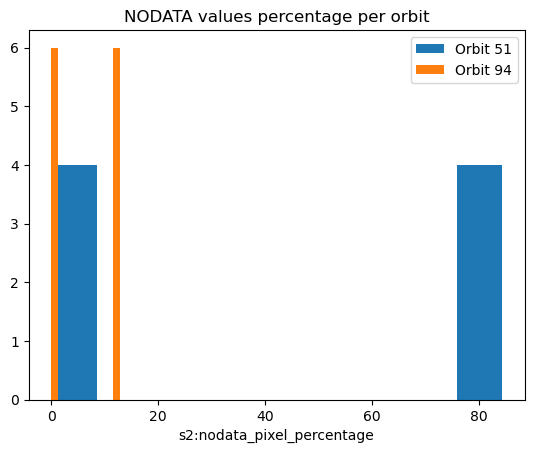

In [10]:
array.sel(time=array.time['sat:relative_orbit']==51)['s2:nodata_pixel_percentage'].plot.hist()
array.sel(time=array.time['sat:relative_orbit']==94)['s2:nodata_pixel_percentage'].plot.hist()

plt.legend(['Orbit 51', 'Orbit 94'])
plt.title('NODATA values percentage per orbit')
plt.show()

# Filtering the cube to the Orbit
**Orbit 51 is full of no data, Then we filter to the orbit 94**

In [44]:
array = array.sel(time=array.time['sat:relative_orbit']==94)
array = array.sel(time=array.time['s2:mgrs_tile']=='30TXQ')
array

<xarray.DataArray 'stackstac-0d073e7a8282a184ad06ce4487b7e93c' (time: 6,
                                                                band: 10,
                                                                y: 2334, x: 7147)>
dask.array<getitem, shape=(6, 10, 2334, 7147), dtype=uint16, chunksize=(6, 1, 1046, 3206), chunktype=numpy.ndarray>
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 2022-07-02...
    id                                       (time) <U54 'S2A_MSIL2A_20220702...
  * band                                     (band) <U3 'B02' 'B03' ... 'SCL'
  * x                                        (x) float64 6.388e+05 ... 7.103e+05
  * y                                        (y) float64 4.944e+06 ... 4.921e+06
    s2:mgrs_tile                             (time) <U5 '30TXQ' ... '30TXQ'
    ...                                       ...
    title                                    (band) <U36 'Band 2 - Blue - 10m...
    gsd                                      (band) float64 10.0 10.0 ... 20.0
    common_name                              (band) object 'blue' ... None
    center_wavelength                        (band) object 0.49 0.56 ... None
    full_width_half_max                      (band) object 0.098 0.045 ... None
    epsg                                     int64 32630
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(638850, 4920830, 710320, 4944...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 638850.00|\n| 0.00,-10.00, 4944170.00|\n| 0.0...
    resolution:  10

# Creating a plot from a combination of bands 

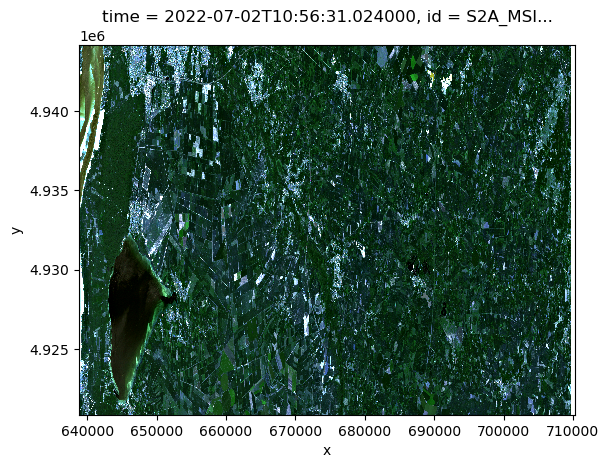

In [12]:
# We only take the visible bands for our visualization
bs = array.band.isin(['B02', 'B03', 'B04'])
ds_bands = array.sel(band=bs).isel(time=0).compute()

ds_bands.plot.imshow(robust=True)

# Checking on the histogram 

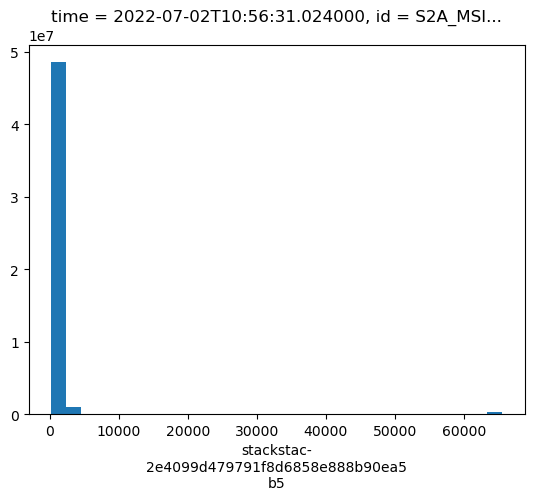

In [13]:
ds_bands.plot.hist(bins=30)
plt.show()

**Slicing the cube to the desired Images for the time series**
(In this case from the second to the last image)

In [45]:
array=array.isel(time=slice(2,None))

# plotting the time series

time: 46.50048637390137


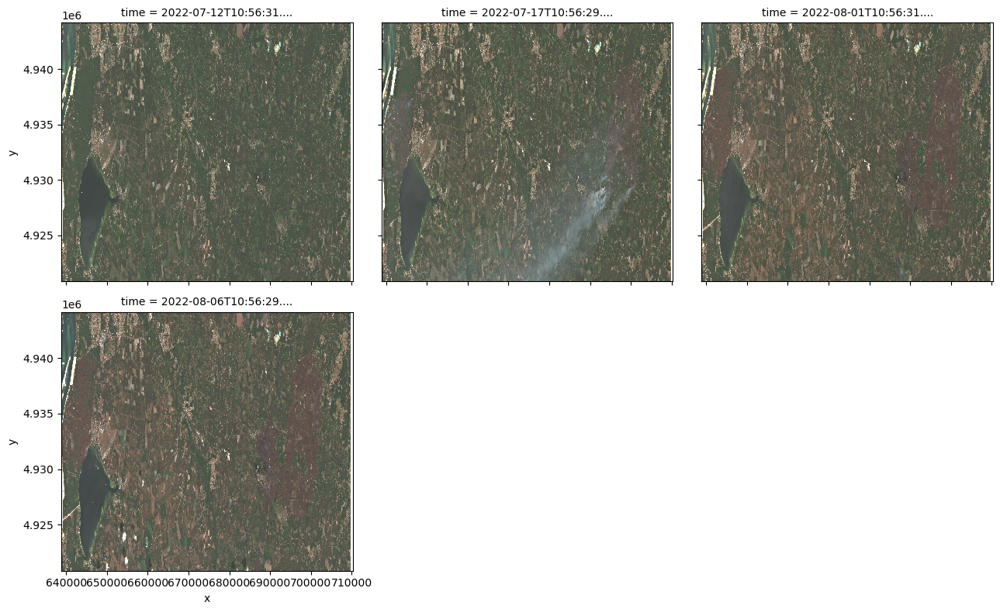

In [15]:
source = array.sel(band=["B04", "B03", "B02"])

rgb = source[:6]
starttime = time.time()
rgb.plot.imshow(col_wrap=3, col="time", rgb="band", vmax=4000, size=4)
print(f"time: {time.time()-starttime}")


# Masking the Water to exclude false positives 

time: 58.074726581573486


/srv/conda/envs/notebook/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


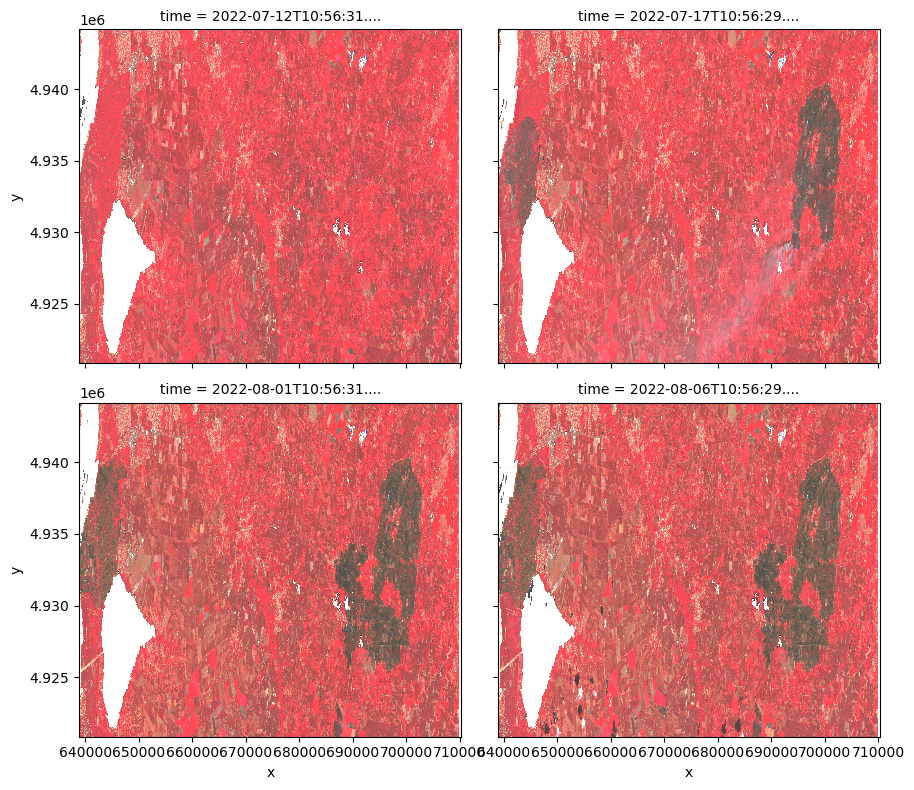

In [46]:
# mask creation
SCL = array.sel(band = 'SCL')
mask = SCL.isin([6])

# application of mask
result = array.where(~mask) #, 0) argument 2 = new output value for nan

source_m = result.sel(band=["B08", "B04", "B03"])
rgb = source_m[:4]
starttime = time.time()
rgb.plot.imshow(col_wrap=2, col="time", rgb="band", vmax=4000, size=4)
print(f"time: {time.time()-starttime}")

# NORMALIZED BURN RATIO 

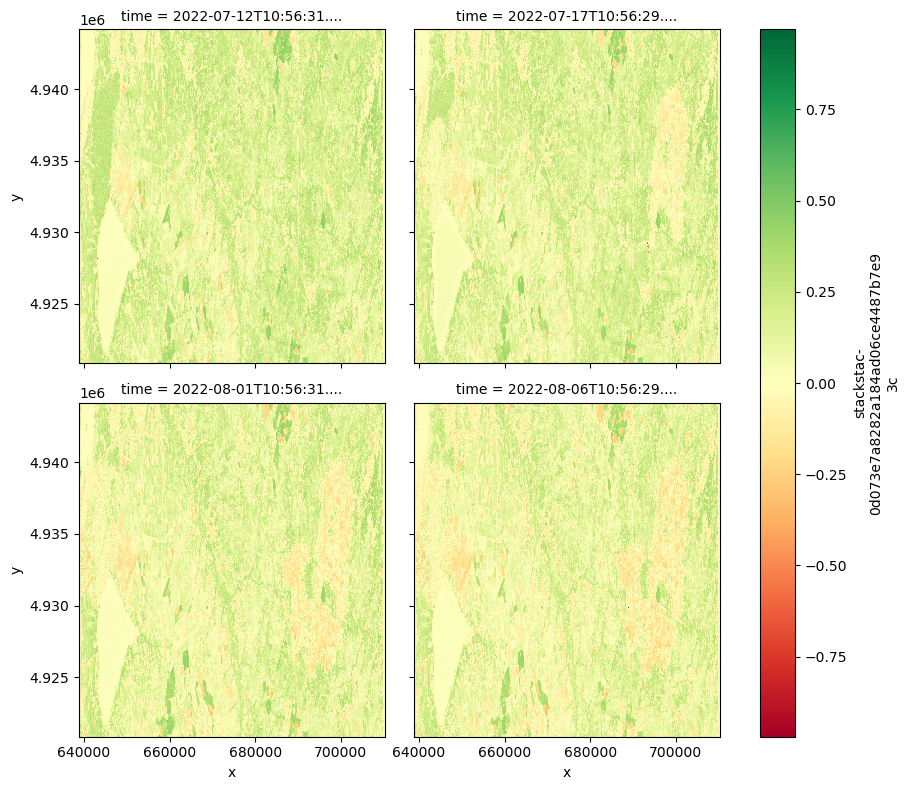

In [47]:
nir, swir,  = array.sel(band="B08").astype('float'), array.sel(band="B11").astype('float')
nbr = (nir-swir)/(nir+swir)
nbr_plt = nbr[:4]

nbr_plt.plot.imshow(col_wrap=2,col='time',size=4,cmap='RdYlGn')

**NBR index**

In [53]:
#nbr_a = nbr[3:4]
#nbr_b = nbr[:1]
nbr_b=nbr.isel(time=0)
nbr_a=nbr.isel(time=3)

nbr_dif = nbr_b-nbr_a

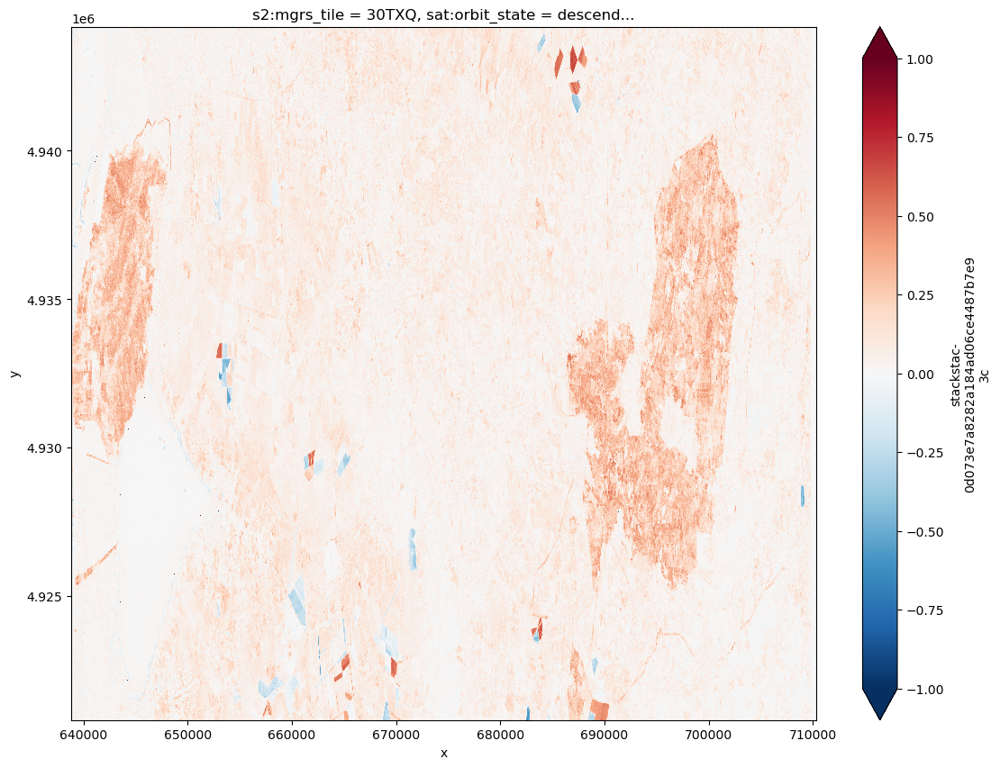

In [54]:
nbr_dif.plot.imshow(vmax=1,size=10)
plt.savefig("mapa.tiff")

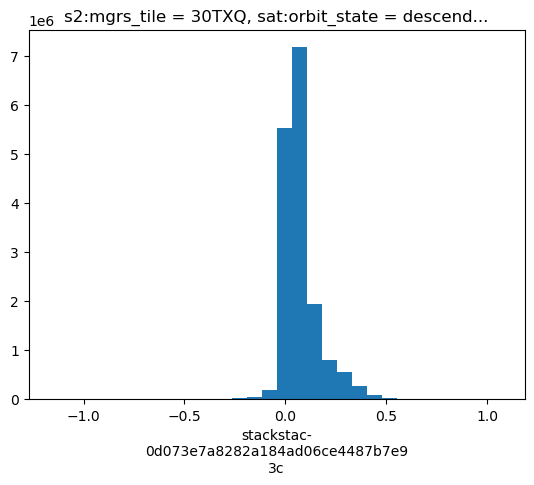

In [55]:
nbr_dif.plot.hist(bins=30)
plt.show()

In [56]:
nbr_dif_array = nbr_dif.squeeze().to_numpy()

In [57]:
display(nbr_dif_array)

array([[ 0.01523247,  0.01602013, -0.00748672, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.02829832,  0.03028373, -0.00057609, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.04418803,  0.03494776,  0.01192884, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-0.01206183,  0.00198802, -0.02321781, ...,  0.        ,
         0.        ,  0.        ],
       [-0.03199786, -0.01738689, -0.01043514, ...,  0.        ,
         0.        ,  0.        ],
       [-0.00686713, -0.03034875, -0.03688012, ...,  0.        ,
         0.        ,  0.        ]])

**Total burned area**

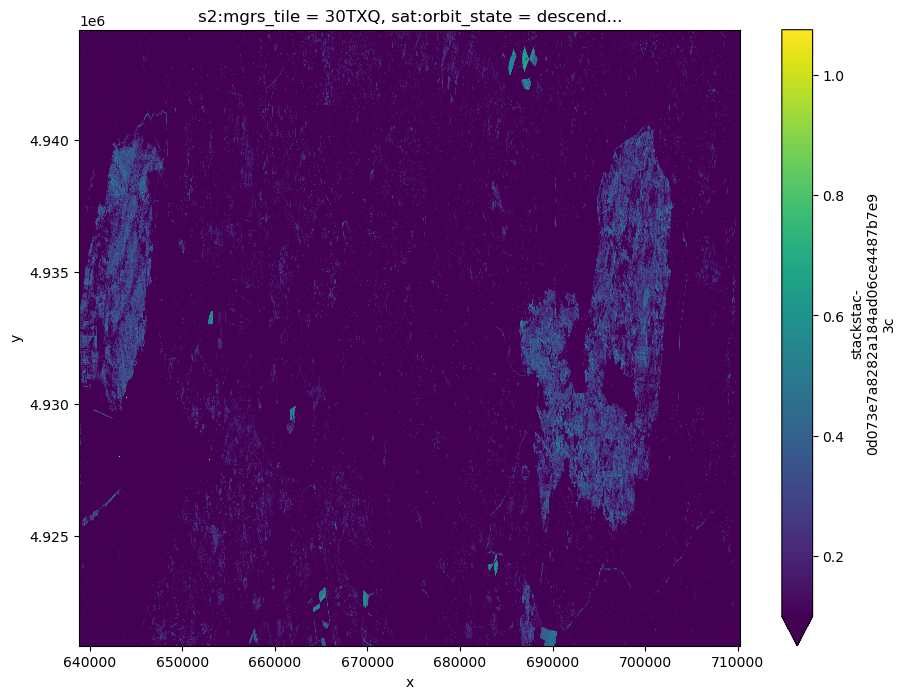

In [60]:
nbr_dif.plot.imshow(vmin=0.1,size=8, cmap= "viridis")

In [61]:
nbr_dif_all = nbr_dif_array[nbr_dif_array > 0.1]
len(nbr_dif_all)

nbr_area_burn = (len(nbr_dif_all)*100)/10000 #ha
print(f"{nbr_area_burn} burned hectares")

39944.98 burned hectares


**Low severity**

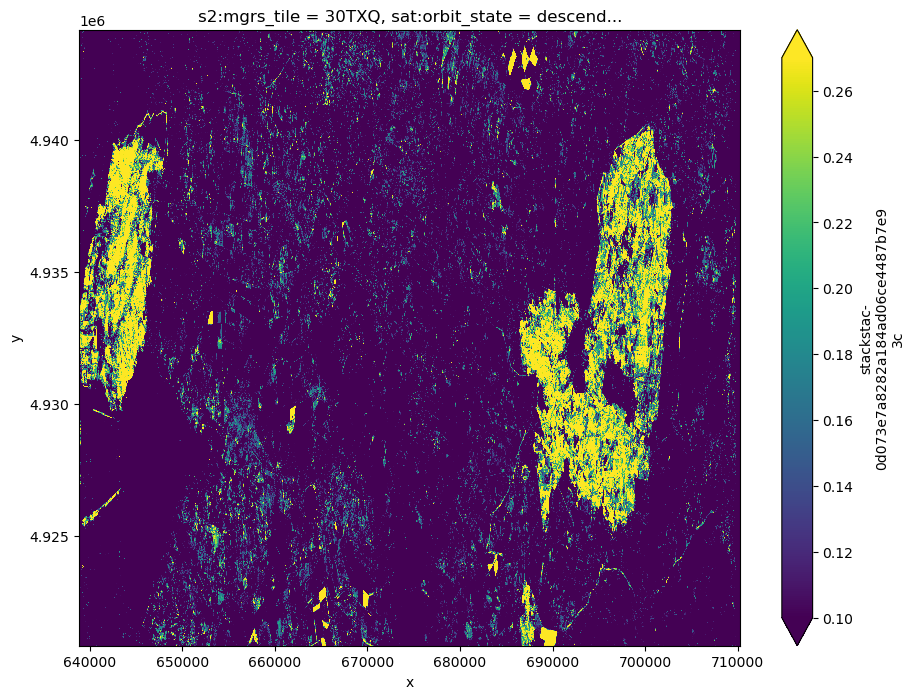

In [62]:
nbr_low = nbr_dif.plot.imshow(vmin=0.1, vmax=0.27, size=8)

In [99]:
nbr_dif_low = nbr_dif_array[(nbr_dif_array > 0.1) & (nbr_dif_array <= 0.27)]
len(nbr_dif_low)

nbr_area_low = (len(nbr_dif_low)*100)/10000 #ha
print(f"{nbr_area_low} low severity burned hectares")
nbr_area_low_per = (nbr_area_low*100)/nbr_area_burn #ha
print(f"{nbr_area_low_per} percentage of low severity burned hectares")

31771.23 low severity burned hectares
79.53747880209227 percentage of low severity burned hectares


**Moderate severity**

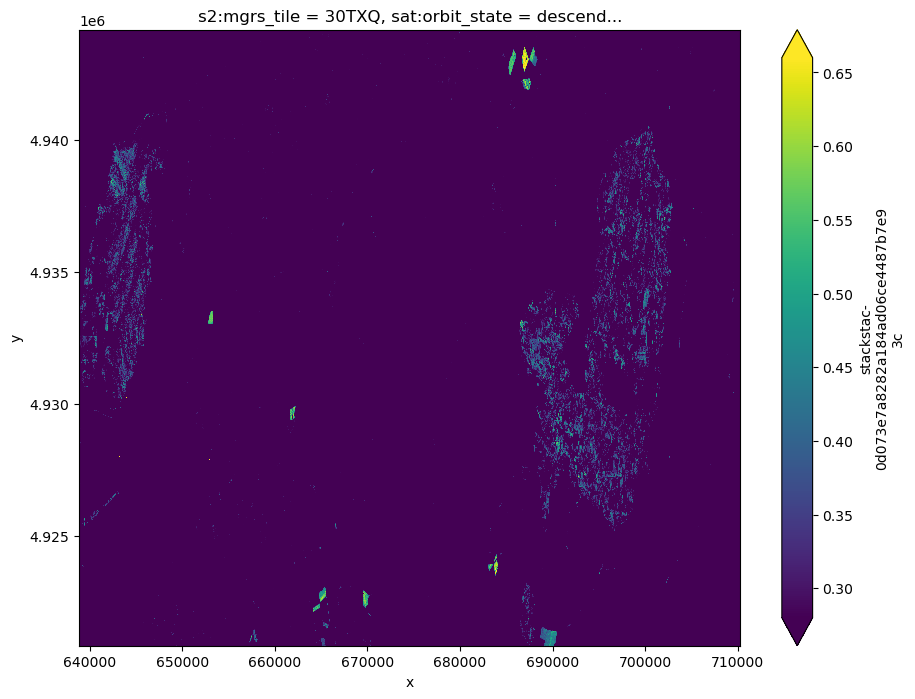

In [64]:
nbr_dif.plot.imshow(vmin=0.28, vmax=0.66, size=8)

In [100]:
nbr_dif_mod = nbr_dif_array[(nbr_dif_array > 0.27) & (nbr_dif_array < 0.66)]
len(nbr_dif_mod)

nbr_area_mod = (len(nbr_dif_mod)*100)/10000 #ha
print(f"{nbr_area_mod} mod severity burned hectares")
nbr_area_mod_per = (nbr_area_mod*100)/nbr_area_burn #ha
print(f"{nbr_area_mod_per} percentage of moderate severity burned hectares")

8161.62 mod severity burned hectares
20.432154428416286 percentage of moderate severity burned hectares


**High severity**

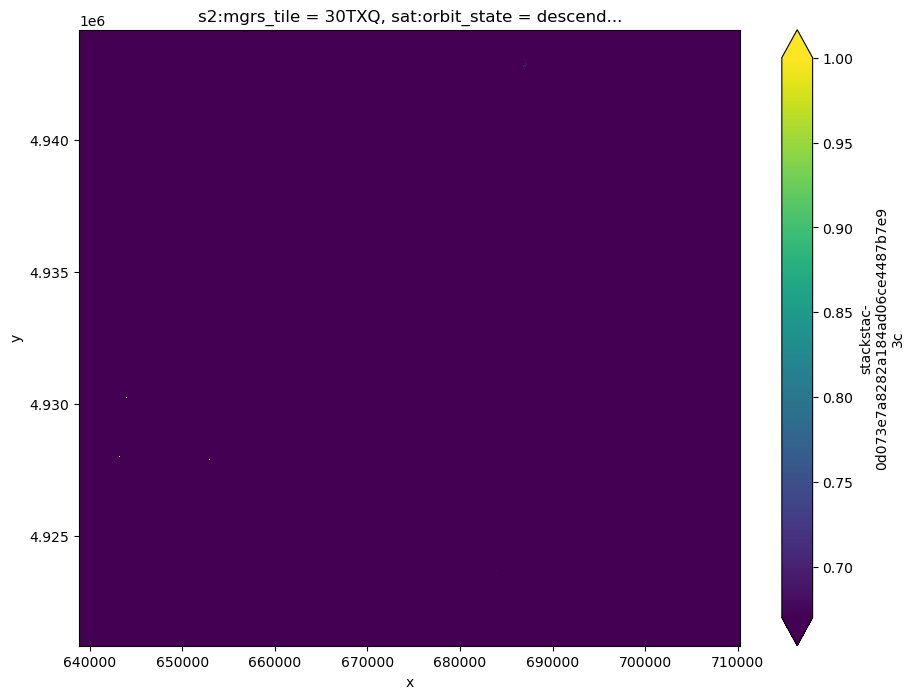

In [66]:
nbr_dif.plot.imshow(vmin=0.67, vmax=1, size=8)

In [101]:
nbr_dif_high = nbr_dif_array[(nbr_dif_array >= 0.66)]
len(nbr_dif_high)

nbr_area_high = (len(nbr_dif_high)*100)/10000 #ha
print(f"{nbr_area_high} high severity burned hectares")
nbr_area_high_per = (nbr_area_high*100)/nbr_area_burn #ha
print(f"{nbr_area_high_per} percentage of high severity burned hectares")

12.13 high severity burned hectares
0.030366769491435467 percentage of high severity burned hectares


**CMAP PLOT**

In [69]:
cmap= ListedColormap(["whitesmoke","floralwhite","bisque","lightcoral","tomato","r"])
norm= colors.BoundaryNorm([0,0.1,0.2,0.27,0.66,1],6)


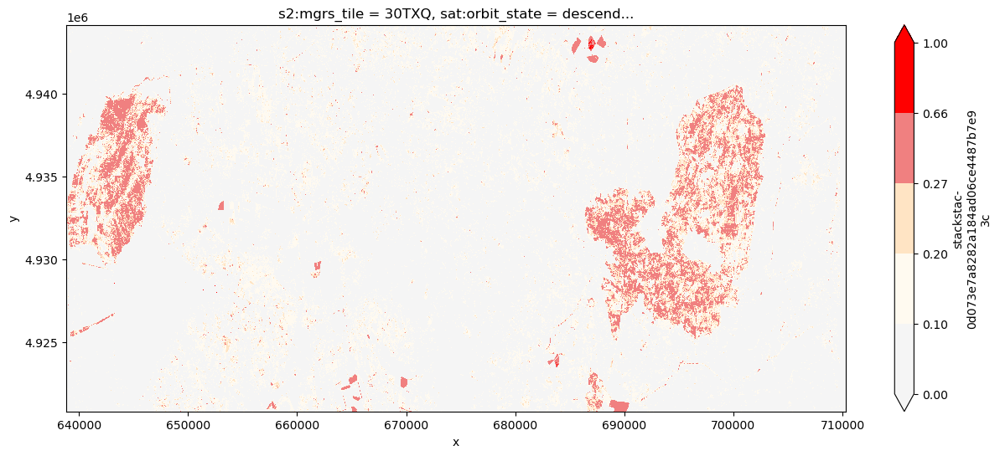

In [70]:
plt.figure(figsize=(15,6))
nbr_dif.plot.imshow(cmap=cmap,norm=norm)
plt.savefig("mapa.jpg")

**Forest type**

In [72]:
import planetary_computer
import pystac_client

# Open the Planetary Computer STAC API
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1/",
    modifier=planetary_computer.sign_inplace,
)
collection = catalog.get_collection("esa-cci-lc")
collection

id: esa-cci-lc
title: ESA Climate Change Initiative Land Cover Maps (Cloud Optimized GeoTIFF)
"description: The ESA Climate Change Initiative (CCI) [Land Cover dataset](https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-land-cover?tab=overview) provides consistent global annual land cover maps at 300m spatial resolution from 1992 to 2020. The land cover classes are defined using the United Nations Food and Agriculture Organization's (UN FAO) [Land Cover Classification System](https://www.fao.org/land-water/land/land-governance/land-resources-planning-toolbox/category/details/en/c/1036361/) (LCCS). In addition to the land cover maps, four quality flags are produced to document the reliability of the classification and change detection. The data in this Collection have been converted from the [original NetCDF data](https://planetarycomputer.microsoft.com/dataset/esa-cci-lc-netcdf) to a set of tiled [Cloud Optimized GeoTIFFs](https://www.cogeo.org/) (COGs)."
"providers: VITO (licensor): Provides the PROBA-V source data (for v2.0). UCLouvain (producer): UCLouvain produces the dataset (v2.1) for the ESA Climate Change Initiative. Brockmann Consult (processor): Brockmann Consult is responsible for the required pre-processing and the distribution of the dataset (v2.1). ESA Climate Change Initiative (licensor): The ESA Climate Change Initiative (CCI) is leading the product creation. Copernicus (licensor): Hosts the data on the Copernicus Climate Data Store (CDS). Microsoft (processor, host)"
type: Collection
sci:doi: 10.24381/cds.006f2c9a
msft:group_id: esa-cci-lc
msft:container: esa-cci-lc
msft:storage_account: landcoverdata
msft:short_description: Tiled ESA CCI global land cover maps in COG format
msft:region: westeurope


In [73]:
# Search the catalog and collection for desired items
Location = [-0.791016,44.541548]
geometry = {
    "type": "Point",
    "coordinates": Location,
}
search = catalog.search(collections=collection, intersects=geometry, datetime="2020")
items = list(search.items())
display(items)

[<Item id=C3S-LC-L4-LCCS-Map-300m-P1Y-2020-v2.1.1-N00W045>]

In [74]:
from IPython.display import Image

Image(url=items[0].assets["rendered_preview"].href)

In [75]:
item_lc = catalog.get_collection('esa-cci-lc').get_item("C3S-LC-L4-LCCS-Map-300m-P1Y-2020-v2.1.1-N00W045")
item_lc

id: C3S-LC-L4-LCCS-Map-300m-P1Y-2020-v2.1.1-N00W045
"bbox: [-45.0, 0.0, 0.0, 45.00000000000001]"
"title: ESA CCI Land Cover Map for Year 2020, Tile N00W045"
created: 2023-01-11T23:08:36.129624Z
datetime: None
proj:epsg: 4326
"proj:shape: [16200, 16200]"
end_datetime: 2020-12-31T23:59:59Z
"proj:transform: [0.002777777777777778, 0.0, -45.0, 0.0, -0.0027777777777777783, 45.00000000000001]"
start_datetime: 2020-01-01T00:00:00Z
esa_cci_lc:tile: N00W045


In [76]:
from IPython.display import Image

Image(url=item_lc.assets["rendered_preview"].href)

In [77]:
import rich.table

# Assets
t_assets = rich.table.Table("Key", "Value")
for key, asset in items[0].assets.items():
    t_assets.add_row(key, asset.title)
t_assets

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Key                 ┃ Value                                                            ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ lccs_class          │ Land Cover Class Defined in the Land Cover Classification System │
│ change_count        │ Number of Class Changes                                          │
│ processed_flag      │ Land Cover Map Processed Area Flag                               │
│ observation_count   │ Number of Valid Observations                                     │
│ current_pixel_state │ Land Cover Pixel Type Mask                                       │
│ tilejson            │ TileJSON with default rendering                                  │
│ rendered_preview    │ Rendered preview                                                 │
└─────────────────────┴──────────────────────────────────────────────────────────────────┘

In [78]:
import odc.stac

#latitude = 39.50
#longitude = -98.35
#buffer = 5
bbox = aoi_bounds


ds = odc.stac.load(items, bbox=bbox)
ds

<xarray.Dataset>
Dimensions:              (latitude: 71, longitude: 322, time: 1)
Coordinates:
  * latitude             (latitude) float64 44.62 44.62 44.62 ... 44.43 44.43
  * longitude            (longitude) float64 -1.249 -1.246 ... -0.3597 -0.3569
    spatial_ref          int32 4326
  * time                 (time) datetime64[ns] 2020-01-01
Data variables:
    lccs_class           (time, latitude, longitude) uint8 210 210 210 ... 60 60
    change_count         (time, latitude, longitude) uint8 0 0 0 0 0 ... 0 0 0 0
    processed_flag       (time, latitude, longitude) uint8 1 1 1 1 1 ... 1 1 1 1
    observation_count    (time, latitude, longitude) uint16 119 53 ... 262 262
    current_pixel_state  (time, latitude, longitude) uint8 1 1 2 2 2 ... 1 1 1 1

In [79]:
from pystac.extensions.item_assets import ItemAssetsExtension

ia = ItemAssetsExtension.ext(collection)
x = ia.item_assets["lccs_class"]

class_names = {
    x["description"]: x["value"] for x in x.properties["classification:classes"]
}
class_values = {v: k for k, v in class_names.items()}

t = rich.table.Table("Description", "Value")
for k, v in class_names.items():
    t.add_row(k, str(v))
t

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Description                                                                        ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ No data                                                                            │ 0     │
│ Cropland, rainfed                                                                  │ 10    │
│ Cropland, rainfed, herbaceous cover                                                │ 11    │
│ Cropland, rainfed, tree, or shrub cover                                            │ 12    │
│ Cropland, irrigated or post-flooding                                               │ 20    │
│ Mosaic cropland (>50%) / natural vegetation (tree, shrub, herbaceous cover) (<50%) │ 30    │
│ Mosaic natural vegetation (tree, shrub, herbaceous cover) (>50%) / cropland (<50%) │ 40    │
│ Tree cover, broadleaved, evergreen, closed to open (>15%)                          │ 50    │
│ Tree cover, broadleaved, deciduous, closed to open (>15%)                          │ 60    │
│ Tree cover, broadleaved, deciduous, closed (>40%)                                  │ 61    │
│ Tree cover, broadleaved, deciduous, open (15-40%)                                  │ 62    │
│ Tree cover, needleleaved, evergreen, closed to open (>15%)                         │ 70    │
│ Tree cover, needleleaved, evergreen, closed (>40%)                                 │ 71    │
│ Tree cover, needleleaved, evergreen, open (15-40%)                                 │ 72    │
│ Tree cover, needleleaved, deciduous, closed to open (>15%)                         │ 80    │
│ Tree cover, needleleaved, deciduous, closed (>40%)                                 │ 81    │
│ Tree cover, needleleaved, deciduous, open (15-40%)                                 │ 82    │
│ Tree cover, mixed leaf type (broadleaved and needleleaved)                         │ 90    │
│ Mosaic tree and shrub (>50%) / herbaceous cover (<50%)                             │ 100   │
│ Mosaic herbaceous cover (>50%) / tree and shrub (<50%)                             │ 110   │
│ Shrubland                                                                          │ 120   │
│ Evergreen shrubland                                                                │ 121   │
│ Deciduous shrubland                                                                │ 122   │
│ Grassland                                                                          │ 130   │
│ Lichens and mosses                                                                 │ 140   │
│ Sparse vegetation (tree, shrub, herbaceous cover) (<15%)                           │ 150   │
│ Sparse tree (<15%)                                                                 │ 151   │
│ Sparse shrub (<15%)                                                                │ 152   │
│ Sparse herbaceous cover (<15%)                                                     │ 153   │
│ Tree cover, flooded, fresh or brackish water                                       │ 160   │
│ Tree cover, flooded, saline water                                                  │ 170   │
│ Shrub or herbaceous cover, flooded, fresh/saline/brackish water                    │ 180   │
│ Urban areas                                                                        │ 190   │
│ Bare areas                                                                         │ 200   │
│ Consolidated bare areas                                                            │ 201   │
│ Unconsolidated bare areas                                                          │ 202   │
│ Water bodies                                                                       │ 210   │
│ Permanent snow and ice                                                             │ 220   │
└────────────────────────────────────────────────────────────────────────────────────┴───────┘

In [80]:
import requests

classmap = requests.get(
    "https://planetarycomputer.microsoft.com/api/data/v1/legend/classmap/esa-cci-lc"
).json()
classmap

{'0': [0, 0, 0, 0],
 '10': [255, 255, 100, 255],
 '11': [255, 255, 100, 255],
 '12': [255, 255, 0, 255],
 '20': [170, 240, 240, 255],
 '30': [220, 240, 100, 255],
 '40': [200, 200, 100, 255],
 '50': [0, 100, 0, 255],
 '60': [0, 160, 0, 255],
 '61': [0, 160, 0, 255],
 '62': [170, 200, 0, 255],
 '70': [0, 60, 0, 255],
 '71': [0, 60, 0, 255],
 '72': [0, 80, 0, 255],
 '80': [40, 80, 0, 255],
 '81': [40, 80, 0, 255],
 '82': [40, 100, 0, 255],
 '90': [120, 130, 0, 255],
 '100': [140, 160, 0, 255],
 '110': [190, 150, 0, 255],
 '120': [150, 100, 0, 255],
 '121': [150, 100, 0, 255],
 '122': [150, 100, 0, 255],
 '130': [255, 180, 50, 255],
 '140': [255, 220, 210, 255],
 '150': [255, 235, 175, 255],
 '151': [255, 200, 100, 255],
 '152': [255, 210, 120, 255],
 '153': [255, 235, 175, 255],
 '160': [0, 120, 90, 255],
 '170': [0, 150, 120, 255],
 '180': [0, 220, 130, 255],
 '190': [195, 20, 0, 255],
 '200': [255, 245, 215, 255],
 '201': [220, 220, 220, 255],
 '202': [255, 245, 215, 255],
 '210': [0, 

In [81]:
import matplotlib.colors
import numpy as np

colors = [matplotlib.colors.to_rgba([x / 255 for x in c]) for c in classmap.values()]  #
cmap = matplotlib.colors.ListedColormap(colors, name="esa-cci-lc")
ticks = np.arange(cmap.N)
labels = [class_values.get(value, "nodata") for value in ticks]

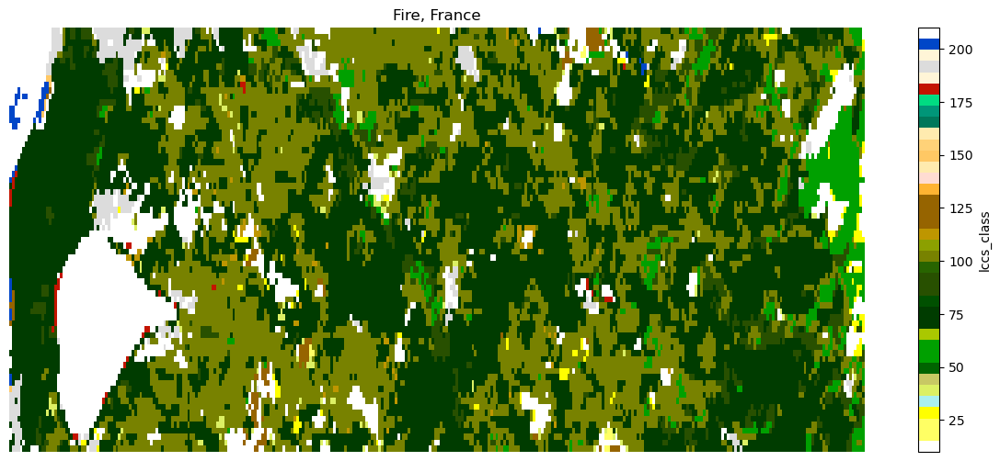

In [85]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(15, 6))

p = (
    ds["lccs_class"]
    .isel(time=0)
    .plot(
        ax=ax,
        cmap=cmap,
    )
)

ax.set_axis_off()

ax.set_title("Fire, France")

colorbar = fig.axes[1]

plt.savefig("cover.tiff")

In [14]:
ds['lccs_class']

<xarray.DataArray 'lccs_class' (time: 1, latitude: 71, longitude: 322)>
array([[[210, 210, 210, ...,  60,  60,  11],
        [210, 210, 210, ...,  60,  60,  11],
        [210, 210, 210, ...,  60,  60,  30],
        ...,
        [ 10,  70, 190, ...,  60,  60,  60],
        [ 70,  70, 190, ..., 100, 100,  60],
        [ 70, 190, 190, ...,  60,  60,  60]]], dtype=uint8)
Coordinates:
  * latitude     (latitude) float64 44.62 44.62 44.62 ... 44.43 44.43 44.43
  * longitude    (longitude) float64 -1.249 -1.246 -1.243 ... -0.3597 -0.3569
    spatial_ref  int32 4326
  * time         (time) datetime64[ns] 2020-01-01
Attributes:
    nodata:   0

In [15]:
ds["lccs_class"].isel(time=0)

<xarray.DataArray 'lccs_class' (latitude: 71, longitude: 322)>
array([[210, 210, 210, ...,  60,  60,  11],
       [210, 210, 210, ...,  60,  60,  11],
       [210, 210, 210, ...,  60,  60,  30],
       ...,
       [ 10,  70, 190, ...,  60,  60,  60],
       [ 70,  70, 190, ..., 100, 100,  60],
       [ 70, 190, 190, ...,  60,  60,  60]], dtype=uint8)
Coordinates:
  * latitude     (latitude) float64 44.62 44.62 44.62 ... 44.43 44.43 44.43
  * longitude    (longitude) float64 -1.249 -1.246 -1.243 ... -0.3597 -0.3569
    spatial_ref  int32 4326
    time         datetime64[ns] 2020-01-01
Attributes:
    nodata:   0

In [171]:
#Dataset_forest = nbr_low.where(ds.lccs_class==50)

#display(Dataset_forest)

#Dataset_forest.plot.imshow(size=8)

#time, x, y = nbr_low.indexes.values()
#ds2_interp = Dataset2.interp(x=x, y=y, method="nearest")
display(nbr_low)

## Import shapefile with burned area polygons

In [18]:
# library for handling STAC data
import pystac_client

# library for accessing Microsoft Planetary Computer's STAC catalog
import planetary_computer

# dataframes and their geospatial data counterpart
import pandas as pd
import geopandas as gpd

# library for vector data
import shapely

# visualization
import folium #maps

# NumPy arrays
import numpy as np

# miscellaneous
from IPython.display import display
import json
from functools import partial
from itertools import cycle

In [19]:
# configuring some formatting settings for the map visuals
higlight_fn = lambda x: {'fillOpacity':0.5}
FGJSON = partial(folium.GeoJson, highlight_function=higlight_fn, zoom_on_click=True)

colors = cycle(['green', 'grey', 'orange', 'red', 'yellow', 'purple', 'pink','brown'])
style_fn = lambda x: {'color':next(colors), 'fillOpacity':0}

In [20]:
with open("Export_Output_2.geojson") as file:
    features = json.load(file)

# We can use folium to easily visualize the polygons on a map
maps = folium.Map(location=[44.559163, -1.148071], zoom_start=11, control_scale=True)
polygon_group = folium.FeatureGroup(name='landcover polygons').add_to(maps)

# these groups will only be used later but it needs to be created before rendering the map
polygon_extent_group = folium.FeatureGroup(name='polygons extent', control=False).add_to(maps)
sat_extent_group = folium.FeatureGroup(name='satellite extents', control=False).add_to(maps)

maps.keep_in_front(polygon_group)
maps.add_child(polygon_group)


for feature in features['features']:
   a = FGJSON(feature['geometry'], name=feature['properties']['Id'])
   polygon_group.add_child(a)



folium.LayerControl().add_to(maps)

maps

In [25]:
with open("Export_Output_2.geojson") as file:
    geojson_feature = json.load(file)

multipolygon = shapely.geometry.MultiPolygon([shape(feature['geometry']) for feature in geojson_feature['features']])


## Crop landcover xarray to burned area polygon coordinates

In [ ]:
#Burned area
landiras_BA = nbr_dif.sel(x=slice(685000,705000), y=slice(4944170,4920000))
plt.figure(figsize=(7,6))
landiras_BA.plot.imshow(cmap=cmap,norm=norm)

In [87]:
# Landcover xarray
epsg_val = nbr_dif["proj:epsg"]
epsg_val = int(epsg_val.to_numpy())


In [91]:
landcover= stackstac.stack(
    item_lc,
    assets=['lccs_class'],
    epsg=epsg_val,
    resolution=10,
    bounds_latlon=aoi_bounds,
)
landcover

/srv/conda/envs/notebook/lib/python3.11/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


<xarray.DataArray 'stackstac-965ceaca0918b4101ba8a15bb725966f' (time: 1,
                                                                band: 1,
                                                                y: 2334, x: 7147)>
dask.array<fetch_raster_window, shape=(1, 1, 2334, 7147), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/17)
  * time                (time) datetime64[ns] NaT
    id                  (time) <U47 'C3S-LC-L4-LCCS-Map-300m-P1Y-2020-v2.1.1-...
  * band                (band) <U10 'lccs_class'
  * x                   (x) float64 6.388e+05 6.389e+05 ... 7.103e+05 7.103e+05
  * y                   (y) float64 4.944e+06 4.944e+06 ... 4.921e+06 4.921e+06
    proj:shape          object {16200}
    ...                  ...
    title               <U64 'Land Cover Class Defined in the Land Cover Clas...
    esa_cci_lc:tile     <U7 'N00W045'
    proj:transform      object {0.0, -0.0027777777777777783, 45.0000000000000...
    raster:bands        object {'nodata': 0, 'sampling': 'area', 'data_type':...
    description         <U145 'Land cover class per pixel, defined using the ...
    epsg                int64 32630
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(638850, 4920830, 710320, 4944...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 638850.00|\n| 0.00,-10.00, 4944170.00|\n| 0.0...
    resolution:  10

In [ ]:
# Landcover slice
landiras_landcover = landcover.sel(x=slice(685000,705000), y=slice(4944170,4920000))
landiras_landcover.plot.imshow()

## Rasterize burned area polygons to overlap with landcover map

In [ ]:
#rasterize

s2_ref_crs = landcover.crs
s2_ref_trf = landcover.transform
s2_ref_shape = (landcover['x'].size, landcover['y'].size)

print(f'- S2 CRS: {s2_ref_crs}')
print(f'- S2 affine transform: \n{s2_ref_trf}')
print(f'- S2 XY dimension: {s2_ref_shape}')

In [ ]:
import geopandas as gpd

field = gpd.read_file('Export_Output_2.geojson')
field_to_raster_crs = field.to_crs(s2_ref_crs)
geom = field_to_raster_crs[['geometry','Id']].values.tolist()

field_cropped_raster = features.rasterize(geom, out_shape=s2_ref_shape, fill=0, transform=s2_ref_trf)
field_cropped_raster_xarr = xr.DataArray(field_cropped_raster)

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(field_cropped_raster_xarr)

# Comparison with 2023

In [92]:
# retrieving the relevant STAC Item
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
    )

# bounding box expressed in Lat/Lon
aoi_bounds = (-1.249695,44.427406,-0.357742,44.620288)


start_date ='2023-05-10'
end_date ='2023-07-28'

sat_coll = ['sentinel-2-l2a']
sat_coll


['sentinel-2-l2a']

In [93]:
aoi_bounds = (-1.249695,44.427406, 
              -0.357742,44.620288)
cloud_nb = 10
# retrieving the relevant STAC Item
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
    )

#today = date.today()
#last_month = today.replace(month=today.month-1).strftime('%Y-%m')
time_range = f"2023-05-10/2023-07-28"#{last_month}"
search = catalog.search(
    collections=['sentinel-2-l2a'],
    datetime=time_range,
    bbox=aoi_bounds,
    query={ "eo:cloud_cover": {"lt": cloud_nb}},
    sortby="datetime"
)
items = search.item_collection()
print(f"{len(items)} items found")

12 items found


In [94]:
for img in items:
    print(img.id,img.datetime)

S2A_MSIL2A_20230528T105621_R094_T30TYQ_20230528T185317 2023-05-28 10:56:21.024000+00:00
S2A_MSIL2A_20230614T105031_R051_T30TYQ_20230614T182837 2023-06-14 10:50:31.024000+00:00
S2A_MSIL2A_20230624T104621_R051_T30TYQ_20230624T193005 2023-06-24 10:46:21.024000+00:00
S2A_MSIL2A_20230624T104621_R051_T30TYQ_20230624T183658 2023-06-24 10:46:21.024000+00:00
S2A_MSIL2A_20230624T104621_R051_T30TXQ_20230624T192937 2023-06-24 10:46:21.024000+00:00
S2A_MSIL2A_20230624T104621_R051_T30TXQ_20230624T183648 2023-06-24 10:46:21.024000+00:00
S2A_MSIL2A_20230707T105621_R094_T30TYQ_20230707T194319 2023-07-07 10:56:21.024000+00:00
S2A_MSIL2A_20230714T105031_R051_T30TYQ_20230714T182929 2023-07-14 10:50:31.024000+00:00
S2A_MSIL2A_20230714T105031_R051_T30TXQ_20230714T182918 2023-07-14 10:50:31.024000+00:00
S2B_MSIL2A_20230722T105629_R094_T30TYQ_20230722T155228 2023-07-22 10:56:29.024000+00:00
S2A_MSIL2A_20230727T105621_R094_T30TYQ_20230727T201542 2023-07-27 10:56:21.024000+00:00
S2A_MSIL2A_20230727T105621_R094_

In [95]:
time_steps_pc = len(items)

bands = ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B11', 'B12', 'SCL']
FILL_VALUE = 2**16-1
array_2023 = stackstac.stack(
                    items,
                    assets = bands,
                    resolution=10,
                    dtype="uint16",
                    fill_value=FILL_VALUE,
                    bounds_latlon=aoi_bounds,
                    chunksize= (time_steps_pc, 1, 'auto', 'auto')
                    )
array_2023.drop_duplicates('time')
array_2023 

/srv/conda/envs/notebook/lib/python3.11/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


<xarray.DataArray 'stackstac-61d5e25bdb71d6c90994094d557117b9' (time: 12,
                                                                band: 10,
                                                                y: 2334, x: 7147)>
dask.array<fetch_raster_window, shape=(12, 10, 2334, 7147), dtype=uint16, chunksize=(12, 1, 1351, 4138), chunktype=numpy.ndarray>
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 2023-05-28...
    id                                       (time) <U54 'S2A_MSIL2A_20230528...
  * band                                     (band) <U3 'B02' 'B03' ... 'SCL'
  * x                                        (x) float64 6.388e+05 ... 7.103e+05
  * y                                        (y) float64 4.944e+06 ... 4.921e+06
    s2:mgrs_tile                             (time) <U5 '30TYQ' ... '30TXQ'
    ...                                       ...
    title                                    (band) <U36 'Band 2 - Blue - 10m...
    gsd                                      (band) float64 10.0 10.0 ... 20.0
    common_name                              (band) object 'blue' ... None
    center_wavelength                        (band) object 0.49 0.56 ... None
    full_width_half_max                      (band) object 0.098 0.045 ... None
    epsg                                     int64 32630
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(638850, 4920830, 710320, 4944...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 638850.00|\n| 0.00,-10.00, 4944170.00|\n| 0.0...
    resolution:  10

In [96]:
array_2023['sat:relative_orbit']

<xarray.DataArray 'sat:relative_orbit' (time: 12)>
array([94, 51, 51, 51, 51, 51, 94, 51, 51, 94, 94, 94])
Coordinates: (12/35)
  * time                                     (time) datetime64[ns] 2023-05-28...
    id                                       (time) <U54 'S2A_MSIL2A_20230528...
    s2:mgrs_tile                             (time) <U5 '30TYQ' ... '30TXQ'
    platform                                 (time) <U11 'Sentinel-2A' ... 'S...
    sat:orbit_state                          (time) <U10 'descending' ... 'de...
    s2:processing_baseline                   <U5 '05.09'
    ...                                       ...
    s2:product_uri                           (time) <U65 'S2A_MSIL2A_20230528...
    s2:thin_cirrus_percentage                (time) float64 0.7299 ... 0.001214
    s2:nodata_pixel_percentage               (time) float64 12.65 ... 0.00133
    s2:high_proba_clouds_percentage          (time) float64 2.341 ... 0.1605
    s2:mean_solar_azimuth                    (time) float64 153.2 ... 148.2
    epsg                                     int64 32630

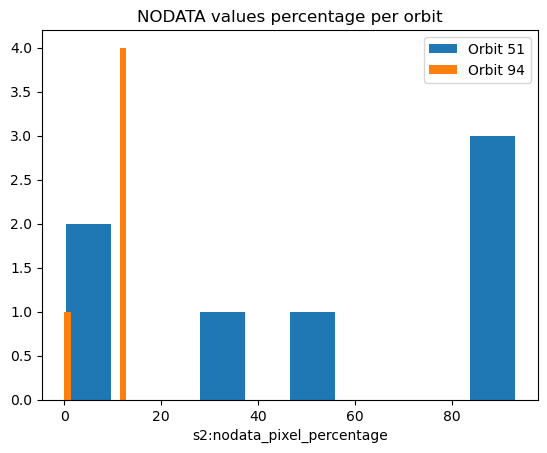

In [97]:
array_2023.sel(time=array_2023.time['sat:relative_orbit']==51)['s2:nodata_pixel_percentage'].plot.hist()
array_2023.sel(time=array_2023.time['sat:relative_orbit']==94)['s2:nodata_pixel_percentage'].plot.hist()

plt.legend(['Orbit 51', 'Orbit 94'])
plt.title('NODATA values percentage per orbit')
plt.show()

In [102]:
array_2023 = array_2023.sel(time=array_2023.time['sat:relative_orbit']==94)
array_2023 = array_2023.sel(time=array_2023.time['s2:mgrs_tile']=='30TXQ')
array_2023

<xarray.DataArray 'stackstac-61d5e25bdb71d6c90994094d557117b9' (time: 1,
                                                                band: 10,
                                                                y: 2334, x: 7147)>
dask.array<getitem, shape=(1, 10, 2334, 7147), dtype=uint16, chunksize=(1, 1, 1351, 4138), chunktype=numpy.ndarray>
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 2023-07-27...
    id                                       (time) <U54 'S2A_MSIL2A_20230727...
  * band                                     (band) <U3 'B02' 'B03' ... 'SCL'
  * x                                        (x) float64 6.388e+05 ... 7.103e+05
  * y                                        (y) float64 4.944e+06 ... 4.921e+06
    s2:mgrs_tile                             (time) <U5 '30TXQ'
    ...                                       ...
    title                                    (band) <U36 'Band 2 - Blue - 10m...
    gsd                                      (band) float64 10.0 10.0 ... 20.0
    common_name                              (band) object 'blue' ... None
    center_wavelength                        (band) object 0.49 0.56 ... None
    full_width_half_max                      (band) object 0.098 0.045 ... None
    epsg                                     int64 32630
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(638850, 4920830, 710320, 4944...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 638850.00|\n| 0.00,-10.00, 4944170.00|\n| 0.0...
    resolution:  10

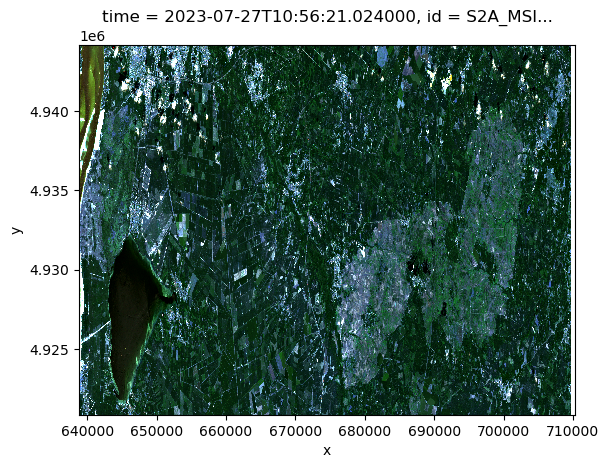

In [103]:
# We only take the visible bands for our visualization
bs = array_2023.band.isin(['B02', 'B03', 'B04'])
ds_bands = array_2023.sel(band=bs).isel(time=0).compute()

ds_bands.plot.imshow(robust=True)

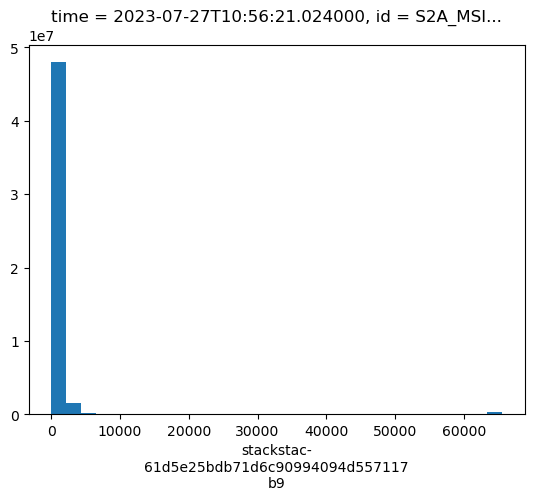

In [104]:
ds_bands.plot.hist(bins=30)
plt.show()

time: 14.448452711105347


<Figure size 2000x600 with 0 Axes>

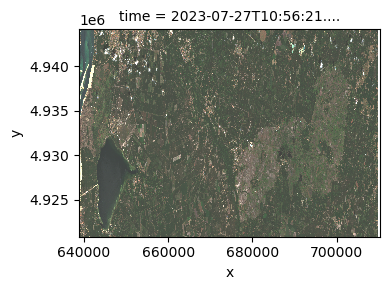

In [126]:
source = array_2023.sel(band=["B04", "B03", "B02"])

plt.figure(figsize=(20,6))

rgb = source[:1]
starttime = time.time()
rgb.plot.imshow(col="time", rgb="band", vmax=4000)
print(f"time: {time.time()-starttime}")
plt.savefig("2023.tiff")